<a href="https://cognitiveclass.ai"><img src = "https://ibm.box.com/shared/static/9gegpsmnsoo25ikkbl4qzlvlyjbgxs5x.png" width = 400> </a>

<h1 align=center><font size = 5>Segmenting and Clustering Neighborhoods in New York City</font></h1>

## Introduction

In this lab, you will learn how to convert addresses into their equivalent latitude and longitude values. Also, you will use the Foursquare API to explore neighborhoods in New York City. You will use the **explore** function to get the most common venue categories in each neighborhood, and then use this feature to group the neighborhoods into clusters. You will use the *k*-means clustering algorithm to complete this task. Finally, you will use the Folium library to visualize the neighborhoods in New York City and their emerging clusters.

## Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

1. <a href="#item1">Download and Explore Dataset</a>

2. <a href="#item2">Explore Neighborhoods in New York City</a>

3. <a href="#item3">Analyze Each Neighborhood</a>

4. <a href="#item4">Cluster Neighborhoods</a>

5. <a href="#item5">Examine Clusters</a>    
</font>
</div>

Before we get the data and start exploring it, let's download all the dependencies that we will need.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
# import k-means from clustering stage
from sklearn.cluster import KMeans
import seaborn as sns

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


<a id='item1'></a>

## 1. Download and Explore Dataset

Neighborhood has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood. 

Luckily, this dataset exists for free on the web. Feel free to try to find this dataset on your own, but here is the link to the dataset: https://geo.nyu.edu/catalog/nyu_2451_34572

For your convenience, I downloaded the files and placed it on the server, so you can simply run a `wget` command and access the data. So let's go ahead and do that.

In [2]:
#!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
#print('Data downloaded!')

#### Load and explore the data

Next, let's load the data.

In [3]:
with open('/Users/Naiara/Desktop/projects/Coursera_Capstone/Capstone/newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Let's take a quick look at the data.

In [4]:
newyork_data

{'type': 'FeatureCollection',
 'totalFeatures': 306,
 'features': [{'type': 'Feature',
   'id': 'nyu_2451_34572.1',
   'geometry': {'type': 'Point',
    'coordinates': [-73.84720052054902, 40.89470517661]},
   'geometry_name': 'geom',
   'properties': {'name': 'Wakefield',
    'stacked': 1,
    'annoline1': 'Wakefield',
    'annoline2': None,
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.84720052054902,
     40.89470517661,
     -73.84720052054902,
     40.89470517661]}},
  {'type': 'Feature',
   'id': 'nyu_2451_34572.2',
   'geometry': {'type': 'Point',
    'coordinates': [-73.82993910812398, 40.87429419303012]},
   'geometry_name': 'geom',
   'properties': {'name': 'Co-op City',
    'stacked': 2,
    'annoline1': 'Co-op',
    'annoline2': 'City',
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.82993910812398,
     40.87429419303012,
     -73.82993910812398,
     40.87429419303012]}},
  {'type': 'Feature',
 

Notice how all the relevant data is in the *features* key, which is basically a list of the neighborhoods. So, let's define a new variable that includes this data.

In [5]:
neighborhoods_data = newyork_data['features']

Let's take a look at the first item in this list.

In [6]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

#### Tranform the data into a *pandas* dataframe

The next task is essentially transforming this data of nested Python dictionaries into a *pandas* dataframe. So let's start by creating an empty dataframe.

In [7]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

Take a look at the empty dataframe to confirm that the columns are as intended.

In [8]:
neighborhoods

,Borough,Neighborhood,Latitude,Longitude


Then let's loop through the data and fill the dataframe one row at a time.

In [9]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

Quickly examine the resulting dataframe.

In [10]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


And make sure that the dataset has all 5 boroughs and 306 neighborhoods.

In [11]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


#### Use geopy library to get the latitude and longitude values of New York City.

In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent <em>ny_explorer</em>, as shown below.

In [12]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


#### Create a map of New York with neighborhoods superimposed on top.

In [13]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

**Folium** is a great visualization library. Feel free to zoom into the above map, and click on each circle mark to reveal the name of the neighborhood and its respective borough.

However, for illustration purposes, let's simplify the above map and segment and cluster only the neighborhoods in Manhattan. So let's slice the original dataframe and create a new dataframe of the Manhattan data.

In [14]:
newyork_data = neighborhoods.copy()
newyork_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


## 2. Explore Neighborhoods in New York

Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.

#### Define Foursquare Credentials and Version

In [15]:
CLIENT_ID = '114NZNSDLZPAK0OJ55IWBXFFJBSGCNZBQBUYDQ4RBNSHSHWN' # your Foursquare ID
CLIENT_SECRET = 'IQXB50UD15YPSB5YV0Q3HRCL0UFMBW2CIG1LPZATQ4INQRTA' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 114NZNSDLZPAK0OJ55IWBXFFJBSGCNZBQBUYDQ4RBNSHSHWN
CLIENT_SECRET:IQXB50UD15YPSB5YV0Q3HRCL0UFMBW2CIG1LPZATQ4INQRTA


<a id='item2'></a>

#### Let's create a function to repeat the same process to all the neighborhoods in New York

In [16]:
LIMIT = 100 # limit of number of venues returned by Foursquare API 

In [17]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Now write the code to run the above function on each neighborhood and create a new dataframe called *manhattan_venues*.

In [19]:
newyork_venues = getNearbyVenues(names=newyork_data['Neighborhood'],
                                   latitudes=newyork_data['Latitude'],
                                   longitudes=newyork_data['Longitude']
                                  )



Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

In [20]:
newyork_venues  = pd.merge(newyork_data, newyork_venues, on=['Neighborhood'])
newyork_venues = newyork_venues.drop(['Latitude', 'Longitude'], axis=1)

newyork_venues = newyork_venues.dropna()


## 3. EDA

Now, we have the dataframe which contains all information about the Borough, Neighbourhoods and Venues from New York, therefore, we are going to analyse this data.

#### Let's check the size of the resulting dataframe

In [21]:
print(newyork_venues.shape)
newyork_venues.head()

(10237, 8)


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bronx,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Bronx,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
2,Bronx,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Bronx,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Bronx,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


#### Firstly, we are going to see how many Neightbourhoods are for each Borough.

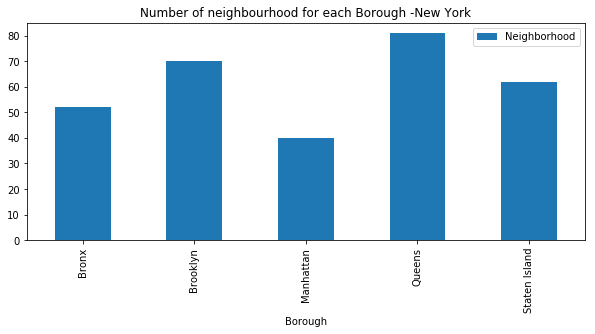

In [22]:
fig, axs = plt.subplots(1,figsize=(10,4))
newyork_venues.groupby(['Borough'])['Neighborhood'].nunique().to_frame().plot.bar(ax = axs)
plt.title('Number of neighbourhood for each Borough -New York')
plt.show()
fig.savefig('/Users/Naiara/Desktop/projects/Coursera_Capstone/Capstone/Figures/NY_Borough.png')

Let's check what type of Venues is in Dataframe

In [23]:
text = list(newyork_venues['Venue Category'].values)
text = ['_'.join(i.split()) for i in text]

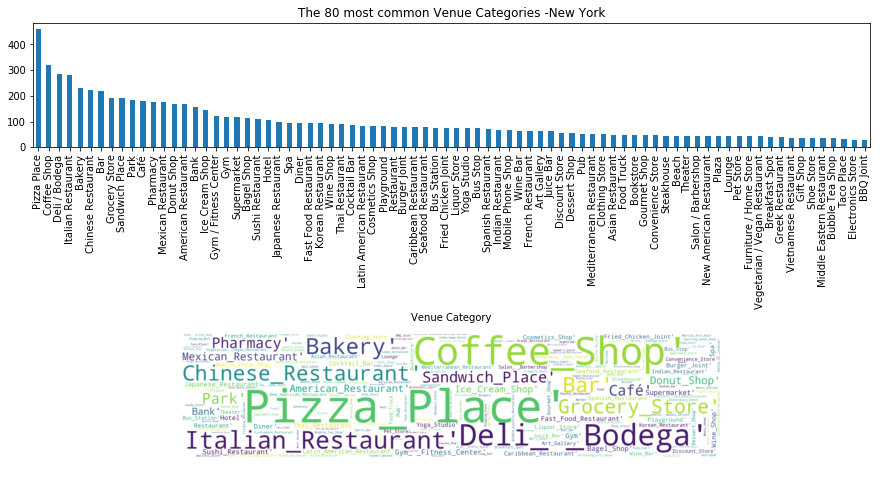

In [24]:
fig, axs = plt.subplots(2,1,figsize=(15,8))
plt.subplots_adjust(hspace=1.5)
aux_df = newyork_venues.groupby(['Venue Category'])['Venue Category'].count().sort_values(ascending=False)
aux_df[0:80].plot.bar(ax=axs[0])
axs[0].set_title('The 80 most common Venue Categories -New York')

wc = WordCloud(background_color="white",width=2600, height=600)
wc.generate(str(text))
axs[1].imshow(wc, interpolation='bilinear')

axs[1].axis("off")

plt.show()

fig.savefig('/Users/Naiara/Desktop/projects/Coursera_Capstone/Capstone/Figures/NY_venues.png')



Let's check how many venues were returned for each neighborhood

In [25]:
newyork_venues.groupby(['Borough','Neighborhood'])['Venue'].count().to_frame()

Venue
Borough       Neighborhood                    
Bronx         Allerton                      33
              Baychester                    22
              Bedford Park                  35
              Belmont                       96
              Bronxdale                     12
              Castle Hill                    9
              City Island                   28
              Claremont Village             16
              Clason Point                  10
              Co-op City                    17
              Concourse                     27
              Concourse Village             39
              Country Club                   4
              East Tremont                  21
              Eastchester                   22
              Edenwald                       7
              Edgewater Park                23
              Fieldston                      3
              Fordham                       82
              High  Bridge                  25
              Hunts Point                   13
              Kingsbridge                   69
              Kingsbridge Heights           31
              Longwood                       7
              Melrose                       28
              Morris Heights                 9
              Morris Park                   25
              Morrisania                    24
              Mott Haven                    22
              Mount Eden                    30
              Mount Hope                    12
              North Riverdale               24
              Norwood                       30
              Olinville                      8
              Parkchester                   34
              Pelham Bay                    39
              Pelham Gardens                19
              Pelham Parkway                22
              Port Morris                   16
              Riverdale                     10
              Schuylerville                 17
              Soundview                     15
              Spuyten Duyvil                 8
              Throgs Neck                   13
              Unionport                     22
              University Heights            20
              Van Nest                      14
              Wakefield                      8
              West Farms                    21
              Westchester Square            34
              Williamsbridge                 6
              Woodlawn                      25
Brooklyn      Bath Beach                    46
              Bay Ridge                     81
              Bedford Stuyvesant            29
              Bensonhurst                   31
              Bergen Beach                   6
              Boerum Hill                   94
              Borough Park                  20
              Brighton Beach                44
              Broadway Junction             18
              Brooklyn Heights             100
              Brownsville                   18
              Bushwick                      72
              Canarsie                       7
              Carroll Gardens              100
              City Line                     32
              Clinton Hill                  91
              Cobble Hill                   95
              Coney Island                  14
              Crown Heights                 23
              Cypress Hills                 33
              Ditmas Park                   47
              Downtown                     100
              Dumbo                         61
              Dyker Heights                  7
              East Flatbush                 12
              East New York                 15
              East Williamsburg             70
              Erasmus                       20
              Flatbush                      24
              Flatlands                     17
              Fort Greene                   60
              Fort Hamilton                 72

#### Let's find out how many unique categories can be curated from all the returned venues

In [26]:
print('There are {} uniques categories.'.format(len(newyork_venues['Venue Category'].unique())))

There are 425 uniques categories.


<a id='item3'></a>

### 3.1. Analyze Each Neighborhood

In [27]:
# one hot encoding
newyork_onehot = pd.get_dummies(newyork_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
newyork_onehot['Neighborhood'] = newyork_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]

newyork_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,North Indian Rest

And let's examine the new dataframe size.

In [28]:
newyork_onehot.shape

(10237, 425)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [29]:
newyork_grouped =newyork_onehot.groupby('Neighborhood').mean().reset_index()
newyork_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,North Indian Rest

#### Let's confirm the new size

In [30]:
newyork_grouped.shape

(301, 425)

#### Let's print each neighborhood along with the top 5 most common venues

In [31]:
num_top_venues = 5

for hood in newyork_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = newyork_grouped[newyork_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
                venue  freq
0         Pizza Place  0.15
1         Supermarket  0.09
2       Deli / Bodega  0.06
3  Chinese Restaurant  0.06
4         Bus Station  0.06


----Annadale----
           venue  freq
0    Pizza Place  0.18
1   Dance Studio  0.09
2     Restaurant  0.09
3  Train Station  0.09
4         Bakery  0.09


----Arden Heights----
         venue  freq
0     Pharmacy   0.2
1  Coffee Shop   0.2
2     Bus Stop   0.2
3  Pizza Place   0.2
4       Lawyer   0.2


----Arlington----
                 venue  freq
0        Deli / Bodega  0.14
1          Coffee Shop  0.14
2             Bus Stop  0.14
3  American Restaurant  0.14
4         Intersection  0.14


----Arrochar----
                venue  freq
0            Bus Stop  0.20
1  Italian Restaurant  0.10
2       Deli / Bodega  0.10
3   Polish Restaurant  0.05
4      Sandwich Place  0.05


----Arverne----
             venue  freq
0        Surf Spot  0.22
1    Metro Station  0.11
2   Sandwich Place  0.11
3       D

            venue  freq
0  Baseball Field  0.11
1           Diner  0.11
2            Bank  0.11
3          Market  0.11
4     Pizza Place  0.11


----Castleton Corners----
            venue  freq
0     Pizza Place  0.20
1            Bank  0.13
2             Bar  0.07
3  Sandwich Place  0.07
4   Tattoo Parlor  0.07


----Central Harlem----
                 venue  freq
0   African Restaurant  0.07
1   Chinese Restaurant  0.07
2  American Restaurant  0.04
3                  Bar  0.04
4  Fried Chicken Joint  0.04


----Charleston----
                 venue  freq
0       Cosmetics Shop  0.07
1        Big Box Store  0.07
2   Italian Restaurant  0.03
3               Bakery  0.03
4  Sporting Goods Shop  0.03


----Chelsea----
            venue  freq
0     Art Gallery  0.10
1     Coffee Shop  0.06
2            Café  0.04
3  Ice Cream Shop  0.04
4            Park  0.03


----Chinatown----
                venue  freq
0  Chinese Restaurant  0.06
1              Bakery  0.04
2        Cocktail Bar  0

4  Persian Restaurant   0.0


----Erasmus----
                  venue  freq
0  Caribbean Restaurant  0.20
1         Grocery Store  0.10
2           Yoga Studio  0.05
3                  Bank  0.05
4     Convenience Store  0.05


----Far Rockaway----
                 venue  freq
0        Deli / Bodega  0.14
1          Pizza Place  0.14
2   Chinese Restaurant  0.10
3        Grocery Store  0.10
4  Fried Chicken Joint  0.07


----Fieldston----
                venue  freq
0               Plaza  0.33
1               River  0.33
2         Bus Station  0.33
3         Yoga Studio  0.00
4  Persian Restaurant  0.00


----Financial District----
                 venue  freq
0          Coffee Shop  0.07
1          Pizza Place  0.05
2                Hotel  0.05
3  American Restaurant  0.05
4   Italian Restaurant  0.03


----Flatbush----
                  venue  freq
0           Coffee Shop  0.08
1         Deli / Bodega  0.08
2  Caribbean Restaurant  0.08
3    Mexican Restaurant  0.08
4        Sandwich

                venue  freq
0         Pizza Place  0.07
1   Mobile Phone Shop  0.07
2      Clothing Store  0.07
3  Mexican Restaurant  0.04
4    Department Store  0.04


----Jamaica Estates----
               venue  freq
0         Eye Doctor  0.25
1       Intersection  0.25
2  Indian Restaurant  0.25
3            Dog Run  0.25
4        Yoga Studio  0.00


----Jamaica Hills----
                  venue  freq
0   Fried Chicken Joint  0.09
1     Indian Restaurant  0.09
2  Fast Food Restaurant  0.09
3              Pharmacy  0.09
4    Chinese Restaurant  0.09


----Kensington----
                venue  freq
0       Grocery Store  0.11
1     Thai Restaurant  0.08
2      Ice Cream Shop  0.05
3         Pizza Place  0.05
4  Mexican Restaurant  0.03


----Kew Gardens----
                venue  freq
0  Chinese Restaurant  0.07
1       Deli / Bodega  0.05
2      Cosmetics Shop  0.05
3         Pizza Place  0.05
4            Pharmacy  0.05


----Kew Gardens Hills----
              venue  freq
0      

                  venue  freq
0          Liquor Store  0.09
1           Bus Station  0.05
2            Playground  0.05
3  Gym / Fitness Center  0.05
4              Bus Stop  0.05


----Old Town----
                venue  freq
0  Italian Restaurant  0.24
1         Video Store  0.06
2        Liquor Store  0.06
3      Mattress Store  0.06
4       Grocery Store  0.06


----Olinville----
                  venue  freq
0  Caribbean Restaurant  0.25
1   Fried Chicken Joint  0.12
2                  Food  0.12
3    Mexican Restaurant  0.12
4            Laundromat  0.12


----Ozone Park----
         venue  freq
0  Pizza Place  0.09
1          Gym  0.06
2         Bank  0.06
3     Pharmacy  0.06
4        Diner  0.06


----Paerdegat Basin----
              venue  freq
0  Asian Restaurant  0.17
1          Bus Line  0.17
2   Harbor / Marina  0.17
3              Food  0.17
4     Moving Target  0.17


----Park Hill----
                  venue  freq
0              Bus Stop  0.29
1    Athletics & Sports 

                venue  freq
0      Clothing Store  0.12
1  Italian Restaurant  0.06
2                 Bar  0.06
3         Pizza Place  0.06
4            Bus Stop  0.06


----Stapleton----
                     venue  freq
0              Pizza Place  0.07
1           Discount Store  0.07
2                     Bank  0.07
3       Mexican Restaurant  0.07
4  New American Restaurant  0.07


----Starrett City----
                  venue  freq
0  Caribbean Restaurant   0.1
1    Chinese Restaurant   0.1
2              Pharmacy   0.1
3           Supermarket   0.1
4           Bus Station   0.1


----Steinway----
                  venue  freq
0   Rental Car Location  0.14
1    Italian Restaurant  0.05
2  Gym / Fitness Center  0.05
3               Brewery  0.05
4                  Café  0.05


----Stuyvesant Town----
            venue  freq
0   Boat or Ferry  0.11
1      Playground  0.11
2            Park  0.11
3  Baseball Field  0.06
4             Bar  0.06


----Sunnyside----
                     

#### Let's put that into a *pandas* dataframe

First, let's write a function to sort the venues in descending order.

In [32]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [33]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = newyork_grouped['Neighborhood']

for ind in np.arange(newyork_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(newyork_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Pizza Place,Supermarket,Deli / Bodega,Chinese Restaurant,Bus Station,Food,Breakfast Spot,Check Cashing Service,Grocery Store,Martial Arts Dojo
1,Annadale,Pizza Place,Liquor Store,American Restaurant,Bakery,Train Station,Diner,Restaurant,Sports Bar,Dance Studio,Pub
2,Arden Heights,Pizza Place,Pharmacy,Coffee Shop,Bus Stop,Lawyer,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit
3,Arlington,Coffee Shop,Intersection,Deli / Bodega,Boat or Ferry,American Restaurant,Grocery Store,Bus Stop,Women's Store,Farmers Market,Farm
4,Arrochar,Bus Stop,Deli / Bodega,Italian Restaurant,Mediterranean Restaurant,Outdoors & Recreation,Bagel Shop,Athletics & Sports,Sandwich Place,Supermarket,Pizza Place


<a id='item4'></a>

## 4. Cluster Neighborhoods

Run *k*-means to cluster the neighborhood.

In [34]:
def cluster_variance(n):
    variances=[]
    kmeans=[]
    outputs=[]
    K=[i for i in range(1,n+1)]
    newyork_grouped_clustering = newyork_grouped.drop('Neighborhood', 1)
    for i in range(1,n+1):
        variance=0
        model=KMeans(n_clusters=i,random_state=82,verbose=2).fit(newyork_grouped_clustering)
        kmeans.append(model)
        variances.append(model.inertia_)
        
    return variances,K,n

In [35]:
variances,K,n=cluster_variance(10)

Initialization complete
Iteration  0, inertia 83.823
Iteration  1, inertia 28.856
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.260985e-08
Initialization complete
Iteration  0, inertia 83.823
Iteration  1, inertia 28.856
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.260985e-08
Initialization complete
Iteration  0, inertia 40.051
Iteration  1, inertia 28.856
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.260985e-08
Initialization complete
Iteration  0, inertia 43.853
Iteration  1, inertia 28.856
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.260985e-08
Initialization complete
Iteration  0, inertia 44.475
Iteration  1, inertia 28.856
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.260985e-08
Initialization complete
Iteration  0, inertia 40.069
Iteration  1, inertia 28.856
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.260985e-08
Initialization c

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 26.506745086084045
start iteration
done sorting
end inner loop
Iteration 1, inertia 26.506745086084045
center shift 0.000000e+00 within tolerance 2.260986e-08
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 25.763658972568464
start iteration
done sorting
end inner loop
Iteration 1, inertia 25.597878739563164
start iteration
done sorting
end inner loop
Iteration 2, inertia 25.57315184812851
start iteration
done sorting
end inner loop
Iteration 3, inertia 25.563348766823683
start iteration
done sorting
end inner loop
Iteration 4, inertia 25.55487633614806
start iteration
done sorting
end inner loop
Iteration 5, inertia 25.540022151193515
start iteration
done sorting
end inner loop
Iteration 6, inertia 25.530108365682167
start iteration
done sorting
end inner loop
Iteration 7, inertia 25.530108365682167
center shift 0.000000e+00 within tolerance 2.260986e-08
In

Iteration 5, inertia 25.356012061704533
start iteration
done sorting
end inner loop
Iteration 6, inertia 25.356012061704533
center shift 0.000000e+00 within tolerance 2.260986e-08
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 26.875411210963033
start iteration
done sorting
end inner loop
Iteration 1, inertia 26.309573126846814
start iteration
done sorting
end inner loop
Iteration 2, inertia 26.145994981491345
start iteration
done sorting
end inner loop
Iteration 3, inertia 26.024369887995476
start iteration
done sorting
end inner loop
Iteration 4, inertia 25.990510851799616
start iteration
done sorting
end inner loop
Iteration 5, inertia 25.960770320574508
start iteration
done sorting
end inner loop
Iteration 6, inertia 25.95987028268426
start iteration
done sorting
end inner loop
Iteration 7, inertia 25.95987028268426
center shift 0.000000e+00 within tolerance 2.260986e-08
Initialization complete
start iteration
done sorting
end inner loop
It

Iteration 9, inertia 24.126593692037904
start iteration
done sorting
end inner loop
Iteration 10, inertia 24.126593692037904
center shift 0.000000e+00 within tolerance 2.260986e-08
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 25.12758256789618
start iteration
done sorting
end inner loop
Iteration 1, inertia 25.034569979168218
start iteration
done sorting
end inner loop
Iteration 2, inertia 24.922316659210704
start iteration
done sorting
end inner loop
Iteration 3, inertia 24.87753239271877
start iteration
done sorting
end inner loop
Iteration 4, inertia 24.762230242917532
start iteration
done sorting
end inner loop
Iteration 5, inertia 24.442394545977447
start iteration
done sorting
end inner loop
Iteration 6, inertia 24.413621616510497
start iteration
done sorting
end inner loop
Iteration 7, inertia 24.397633318416883
start iteration
done sorting
end inner loop
Iteration 8, inertia 24.395487470262516
start iteration
done sorting
end inner lo

Iteration 4, inertia 23.56312101400291
start iteration
done sorting
end inner loop
Iteration 5, inertia 23.550854602191958
start iteration
done sorting
end inner loop
Iteration 6, inertia 23.545725231863383
start iteration
done sorting
end inner loop
Iteration 7, inertia 23.543932539131568
start iteration
done sorting
end inner loop
Iteration 8, inertia 23.54296648316841
start iteration
done sorting
end inner loop
Iteration 9, inertia 23.54296648316841
center shift 0.000000e+00 within tolerance 2.260986e-08
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 24.299769734021815
start iteration
done sorting
end inner loop
Iteration 1, inertia 23.62348103553224
start iteration
done sorting
end inner loop
Iteration 2, inertia 23.12338441689013
start iteration
done sorting
end inner loop
Iteration 3, inertia 22.89565740745183
start iteration
done sorting
end inner loop
Iteration 4, inertia 22.778775383455457
start iteration
done sorting
end inner loop
It

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 23.767946571251723
start iteration
done sorting
end inner loop
Iteration 1, inertia 23.27677033094905
start iteration
done sorting
end inner loop
Iteration 2, inertia 23.181552779786916
start iteration
done sorting
end inner loop
Iteration 3, inertia 23.151589114913573
start iteration
done sorting
end inner loop
Iteration 4, inertia 23.14191995568429
start iteration
done sorting
end inner loop
Iteration 5, inertia 23.14191995568429
center shift 0.000000e+00 within tolerance 2.260986e-08
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 23.5450707670281
start iteration
done sorting
end inner loop
Iteration 1, inertia 23.188158163084452
start iteration
done sorting
end inner loop
Iteration 2, inertia 23.101637728065715
start iteration
done sorting
end inner loop
Iteration 3, inertia 23.05104302139433
start iteration
done sorting
end inner loop
Iteration 4, inert

Iteration 8, inertia 21.537651616003505
start iteration
done sorting
end inner loop
Iteration 9, inertia 21.518315557907645
start iteration
done sorting
end inner loop
Iteration 10, inertia 21.506756596589124
start iteration
done sorting
end inner loop
Iteration 11, inertia 21.494421586022252
start iteration
done sorting
end inner loop
Iteration 12, inertia 21.494421586022252
center shift 0.000000e+00 within tolerance 2.260986e-08
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 22.566627094845263
start iteration
done sorting
end inner loop
Iteration 1, inertia 22.04570585520651
start iteration
done sorting
end inner loop
Iteration 2, inertia 21.70347681913539
start iteration
done sorting
end inner loop
Iteration 3, inertia 21.580523737535042
start iteration
done sorting
end inner loop
Iteration 4, inertia 21.48676259157605
start iteration
done sorting
end inner loop
Iteration 5, inertia 21.43881547167622
start iteration
done sorting
end inner lo

Iteration 5, inertia 21.07007819993742
start iteration
done sorting
end inner loop
Iteration 6, inertia 21.067407074615677
start iteration
done sorting
end inner loop
Iteration 7, inertia 21.063122020424004
start iteration
done sorting
end inner loop
Iteration 8, inertia 21.059756792403522
start iteration
done sorting
end inner loop
Iteration 9, inertia 21.054307414780286
start iteration
done sorting
end inner loop
Iteration 10, inertia 21.03587636035221
start iteration
done sorting
end inner loop
Iteration 11, inertia 21.026028798831398
start iteration
done sorting
end inner loop
Iteration 12, inertia 20.995558884424007
start iteration
done sorting
end inner loop
Iteration 13, inertia 20.972252495835107
start iteration
done sorting
end inner loop
Iteration 14, inertia 20.968163851201933
start iteration
done sorting
end inner loop
Iteration 15, inertia 20.965298452164525
start iteration
done sorting
end inner loop
Iteration 16, inertia 20.964127228293275
start iteration
done sorting
en

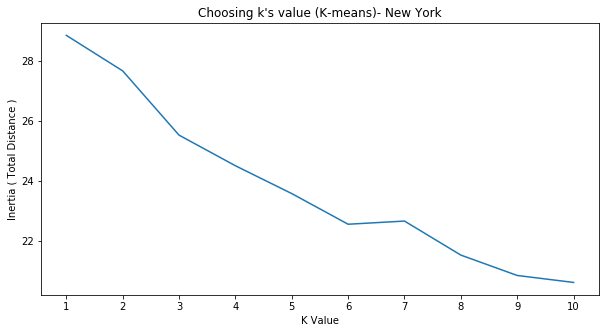

In [36]:
fig, axs =  plt.subplots(1,1, figsize=(10,5))
axs.plot(K,variances)
plt.ylabel("Inertia ( Total Distance )")
plt.xlabel("K Value")
plt.xticks([i for i in range(1,n+1)])
plt.title("Choosing k's value (K-means)- New York")
plt.show()
fig.savefig('/Users/Naiara/Desktop/projects/Coursera_Capstone/Capstone/Figures/NY_K-means.png')

In [37]:
# set number of clusters
kclusters = 6

newyork_grouped_clustering = newyork_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(newyork_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 2, 5, 5, 5, 2, 2, 2, 2, 2], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [38]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


newyork_merged = newyork_data

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
newyork_merged = newyork_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

newyork_merged.head() # check the last columns!

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,2.0,Pharmacy,Laundromat,Ice Cream Shop,Dessert Shop,Sandwich Place,Gas Station,Donut Shop,Women's Store,Ethiopian Restaurant,Event Service
1,Bronx,Co-op City,40.874294,-73.829939,2.0,Bus Station,Baseball Field,Park,Restaurant,Gift Shop,Chinese Restaurant,Fast Food Restaurant,Pizza Place,Discount Store,Bagel Shop
2,Bronx,Eastchester,40.887556,-73.827806,2.0,Caribbean Restaurant,Bus Station,Deli / Bodega,Diner,Bus Stop,Bowling Alley,Platform,Donut Shop,Chinese Restaurant,Metro Station
3,Bronx,Fieldston,40.895437,-73.905643,2.0,River,Bus Station,Plaza,Women's Store,Field,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
4,Bronx,Riverdale,40.890834,-73.912585,2.0,Bus Station,Park,Bank,Plaza,Gym,Home Service,Playground,Food Truck,Dim Sum Restaurant,Field


In [39]:
newyork_merged = newyork_merged.dropna()

Finally, let's visualize the resulting clusters

In [40]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(newyork_merged['Latitude'], newyork_merged['Longitude'], newyork_merged['Neighborhood'], newyork_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters


<a id='item5'></a>

## 5. Examine Clusters

Now, you can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, you can then assign a name to each cluster. I will leave this exercise to you.

In [59]:
def plotting_cluster(cluster):
    # get all venues from cluster dataframe and convert to list
    venues = [item for sublist in cluster.iloc[:,1:].values.tolist() for item in sublist]
    #create dictionary with key: category venue and value: frequency of the category venues.
    venues_dict = {i:venues.count(i) for i in set(venues)}
    #sorted by value descdending the dict
    venues_dict = {r: venues_dict[r] for r in sorted(venues_dict, key=venues_dict.get, reverse=True)}
    venues_30 = {key:value for key,value in list(venues_dict.items())[0:30]}
    #create a dataframe with name category and frequency
    column_names = ['Venues_30', 'freq'] 
    df = pd.DataFrame(columns=column_names)
    df['venues_30'] = list(venues_30.keys())
    df['freq'] = list(venues_30.values()) 
    
    #Plots
    fig, axs = plt.subplots(2,1,figsize=(10,15))
    plt.subplots_adjust(hspace=-0.3)
    #plot bar
    sns.barplot(x='freq', y="venues_30", data=df, ax = axs[1])
    axs[1].set(title='the most number of venues')
    #plot wordcloud
    wc = WordCloud(background_color="white",width=2600, height=600)
    wc.generate(str(venues))
    axs[0].imshow(wc, interpolation='bilinear')
    axs[0].axis("off")
    axs[0].set(title='venues from cluster')
    plt.show()

#### Cluster 1

In [60]:
cluster_1 = newyork_merged.loc[newyork_merged['Cluster Labels'] == 0, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]
cluster_1

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
85,Sea Gate,Beach,Spa,Bus Station,Home Service,Women's Store,Fast Food Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
172,Breezy Point,Trail,Beach,Monument / Landmark,Women's Store,Field,Event Service,Event Space,Exhibit,Eye Doctor,Factory
178,Rockaway Beach,Beach,Deli / Bodega,Arepa Restaurant,Latin American Restaurant,BBQ Joint,Bagel Shop,Food Truck,Pizza Place,Ice Cream Shop,Bar
179,Neponsit,Beach,Women's Store,Entertainment Service,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm
190,Belle Harbor,Beach,Pub,Deli / Bodega,Spa,Boutique,Bakery,Bagel Shop,Mexican Restaurant,Pharmacy,Chinese Restaurant
191,Rockaway Park,Beach,Donut Shop,Pharmacy,Pizza Place,Ice Cream Shop,Deli / Bodega,Smoke Shop,Seafood Restaurant,Bank,Bar
204,South Beach,Deli / Bodega,Pier,Beach,Athletics & Sports,Women's Store,Fast Food Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
232,Midland Beach,Beach,Pet Store,Basketball Court,Bookstore,Deli / Bodega,Chinese Restaurant,Dessert Shop,Medical Center,Bus Stop,Restaurant
288,Roxbury,Baseball Field,Fast Food Restaurant,Irish Pub,Deli / Bodega,Beach,Trail,Ethiopian Restaurant,Event Service,Event Space,Exhibit
302,Hammels,Beach,Food Truck,Diner,Gym / Fitness Center,Fast Food Restaurant,Dog Run,Bus Stop,Bus Station,Shoe Store,Deli / Bodega


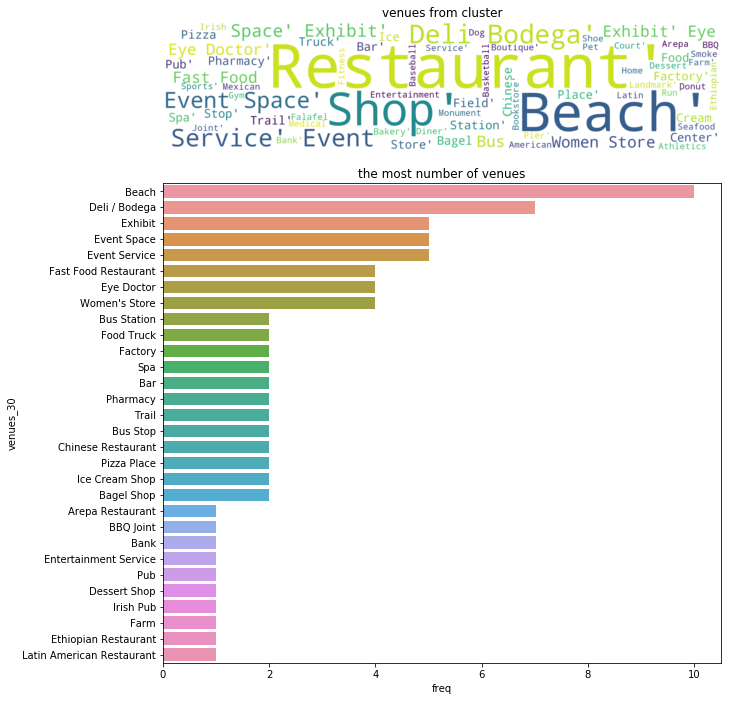

In [61]:
plotting_cluster(cluster_1)

#### Cluster 2

In [62]:
cluster_2 = newyork_merged.loc[newyork_merged['Cluster Labels'] == 1, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]
cluster_2

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
192,Somerville,Park,Women's Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant
203,Todt Hill,Park,Women's Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant
303,Bayswater,Playground,Park,Field,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant


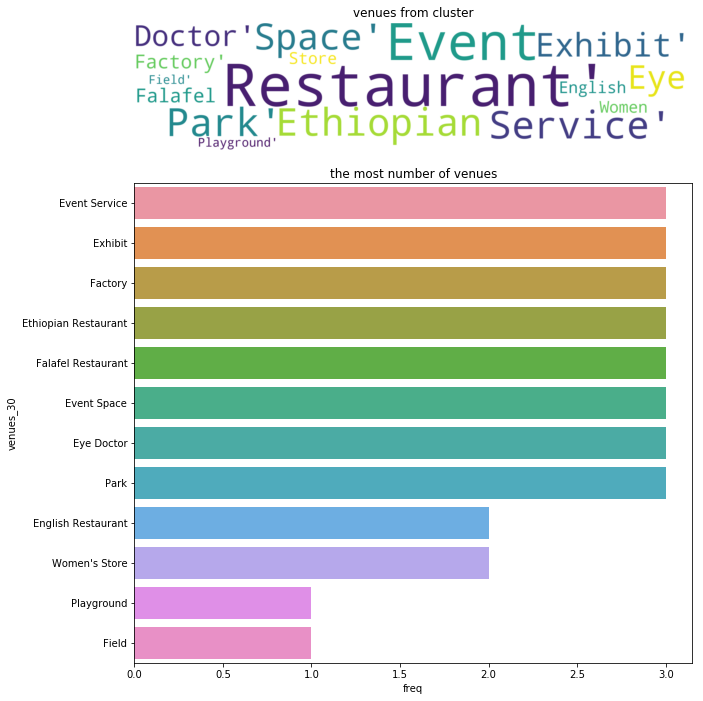

In [63]:
plotting_cluster(cluster_2)

#### Cluster 3

In [64]:
cluster_3 = newyork_merged.loc[newyork_merged['Cluster Labels'] == 2, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]
cluster_3

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Wakefield,Pharmacy,Laundromat,Ice Cream Shop,Dessert Shop,Sandwich Place,Gas Station,Donut Shop,Women's Store,Ethiopian Restaurant,Event Service
1,Co-op City,Bus Station,Baseball Field,Park,Restaurant,Gift Shop,Chinese Restaurant,Fast Food Restaurant,Pizza Place,Discount Store,Bagel Shop
2,Eastchester,Caribbean Restaurant,Bus Station,Deli / Bodega,Diner,Bus Stop,Bowling Alley,Platform,Donut Shop,Chinese Restaurant,Metro Station
3,Fieldston,River,Bus Station,Plaza,Women's Store,Field,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
4,Riverdale,Bus Station,Park,Bank,Plaza,Gym,Home Service,Playground,Food Truck,Dim Sum Restaurant,Field
5,Kingsbridge,Pizza Place,Bar,Bakery,Latin American Restaurant,Supermarket,Mexican Restaurant,Sandwich Place,Pharmacy,Spanish Restaurant,Donut Shop
6,Marble Hill,Sandwich Place,Gym,Coffee Shop,Yoga Studio,Diner,Seafood Restaurant,Tennis Stadium,Shopping Mall,Bank,Miscellaneous Shop
7,Woodlawn,Deli / Bodega,Pub,Pizza Place,Playground,Bar,Italian Restaurant,Indian Restaurant,Food Truck,Grocery Store,Park
8,Norwood,Pizza Place,Park,Deli / Bodega,Bank,Pharmacy,Chinese Restaurant,Supermarket,Caribbean Restaurant,Sandwich Place,Coffee Shop
9,Williamsbridge,Caribbean Restaurant,Soup Place,Nightclub,Convenience Store,Bar,Field,Event Service,Event Space,Exhibit,Eye Doctor


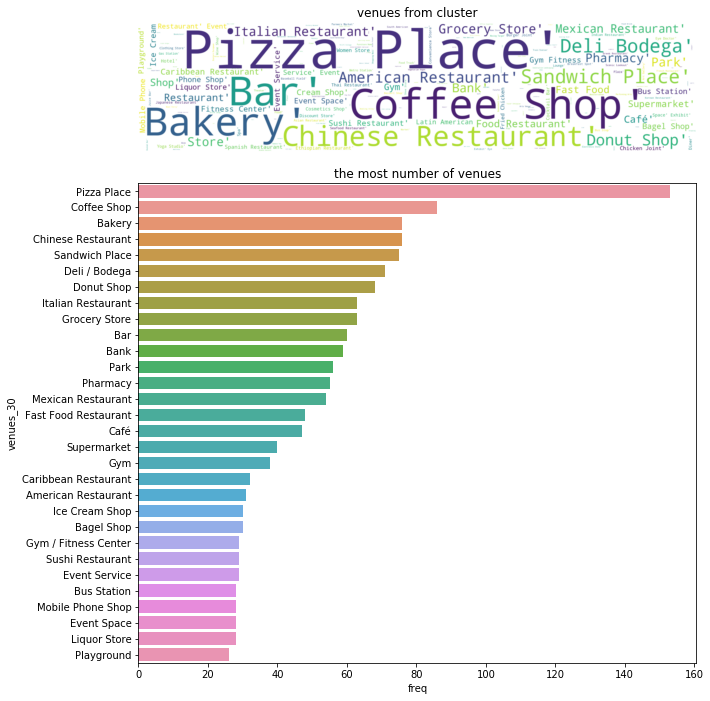

In [65]:
plotting_cluster(cluster_3)

#### Cluster 4

In [66]:
cluster_4= newyork_merged.loc[newyork_merged['Cluster Labels'] == 3, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]
cluster_4

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
150,Whitestone,Bubble Tea Shop,Dance Studio,Deli / Bodega,Candy Store,Women's Store,Filipino Restaurant,Event Space,Exhibit,Eye Doctor,Factory
193,Brookville,Deli / Bodega,Women's Store,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant


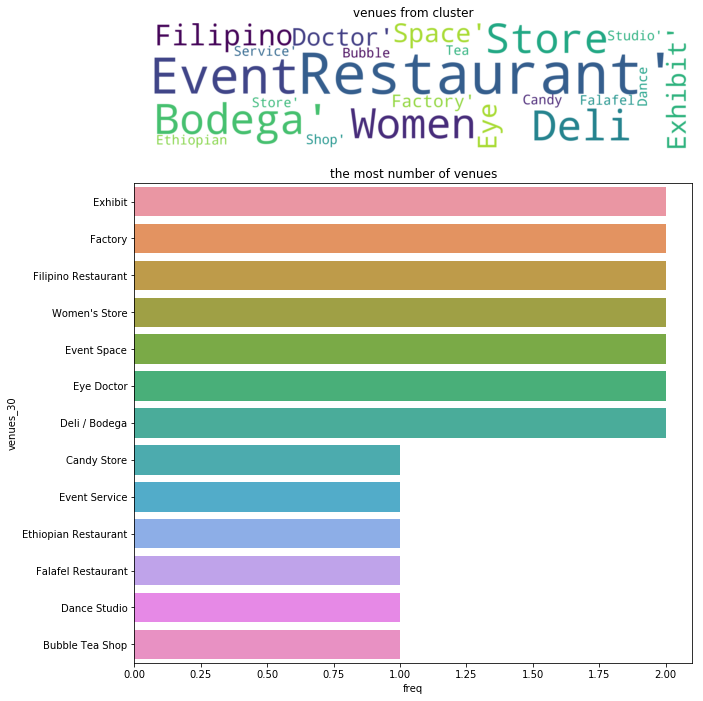

In [67]:
plotting_cluster(cluster_4)

#### Cluster 5

In [68]:
cluster_5 = newyork_merged.loc[newyork_merged['Cluster Labels'] == 4, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]
cluster_5

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
76,Mill Island,Pool,Women's Store,Field,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory


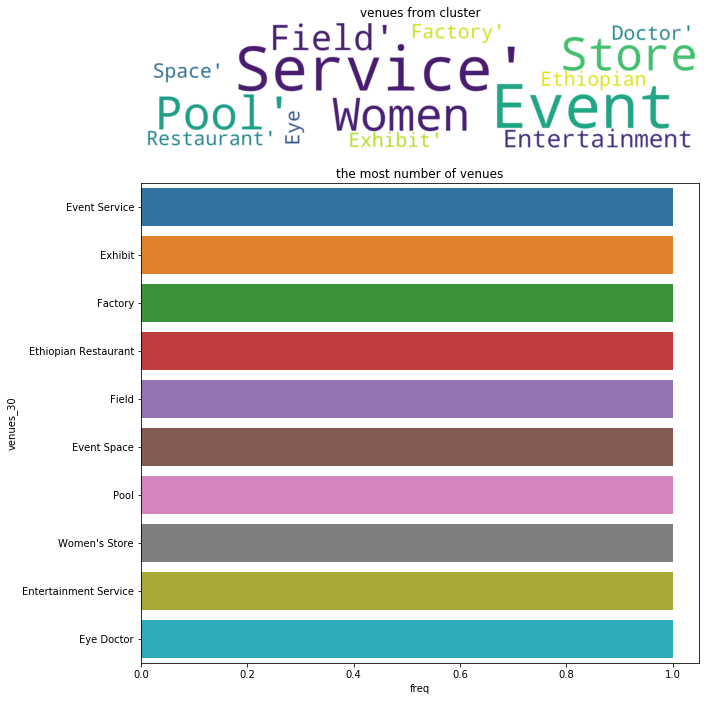

In [69]:
plotting_cluster(cluster_5)

#### Cluster 6

In [70]:
cluster_6 = newyork_merged.loc[newyork_merged['Cluster Labels'] == 5, newyork_merged.columns[[1] + list(range(6, newyork_merged.shape[1]))]]
cluster_6

,Neighborhood,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
27,Clason Point,Pool,South American Restaurant,Grocery Store,American Restaurant,Boat or Ferry,Bus Stop,Factory,Farm,Falafel Restaurant
77,Manhattan Beach,Café,Beach,Sandwich Place,Playground,Ice Cream Shop,Harbor / Marina,Food,Event Space,Farmers Market
198,New Brighton,Park,Deli / Bodega,Discount Store,Bowling Alley,Playground,Women's Store,Fast Food Restaurant,Farmers Market,Falafel Restaurant
202,Grymes Hill,Dog Run,Women's Store,Filipino Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant
206,Mariner's Harbor,Deli / Bodega,Bus Stop,Filipino Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant
212,Oakwood,Lawyer,Bar,Women's Store,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
217,Tottenville,Cosmetics Shop,Lawyer,Mexican Restaurant,Bus Stop,Home Service,Deli / Bodega,Italian Restaurant,Exhibit,Fast Food Restaurant
224,Park Hill,Athletics & Sports,Gym / Fitness Center,Coffee Shop,Hotel,Women's Store,Fast Food Restaurant,Event Service,Event Space,Exhibit
227,Arlington,Intersection,Deli / Bodega,Boat or Ferry,American Restaurant,Grocery Store,Bus Stop,Women's Store,Farmers Market,Farm
228,Arrochar,Deli / Bodega,Italian Restaurant,Mediterranean Restaurant,Outdoors & Recreation,Bagel Shop,Athletics & Sports,Sandwich Place,Supermarket,Pizza Place


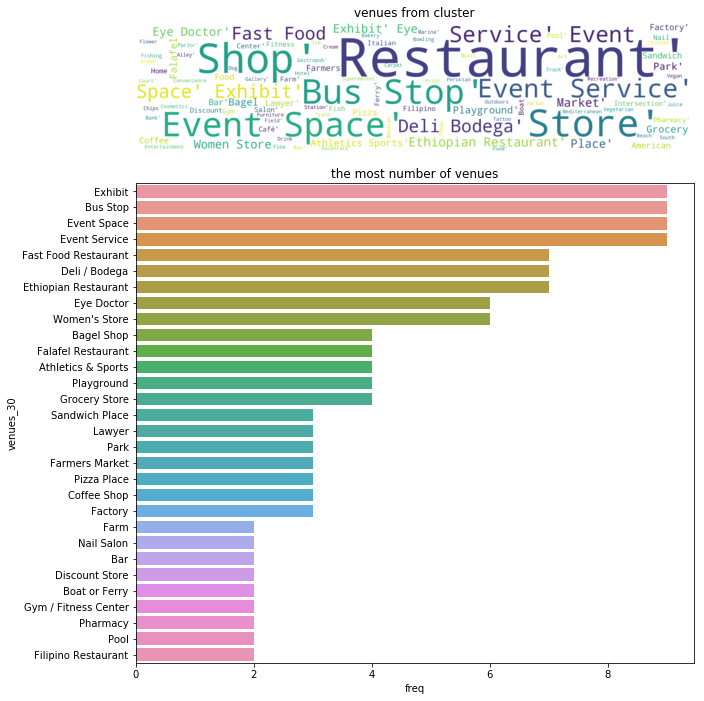

In [71]:
plotting_cluster(cluster_6)

### Thank you for completing this lab!

This notebook was created by [Alex Aklson](https://www.linkedin.com/in/aklson/) and [Polong Lin](https://www.linkedin.com/in/polonglin/). I hope you found this lab interesting and educational. Feel free to contact us if you have any questions!

This notebook is part of a course on **Coursera** called *Applied Data Science Capstone*. If you accessed this notebook outside the course, you can take this course online by clicking [here](http://cocl.us/DP0701EN_Coursera_Week3_LAB2).

<hr>

Copyright &copy; 2018 [Cognitive Class](https://cognitiveclass.ai/?utm_source=bducopyrightlink&utm_medium=dswb&utm_campaign=bdu). This notebook and its source code are released under the terms of the [MIT License](https://bigdatauniversity.com/mit-license/).